# Task 1 - Exploratory Data Analysis on Dataset - Terrorism 

# LGMVIP

# By Salman Arif

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
!pip install folium
import folium
from folium.plugins import MarkerCluster 
%matplotlib inline

In [2]:
data = pd.read_csv('Terrorism.csv')

/home/salman/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (4,6,19,20,25,26,30,31,32,33,34,36,40,42,44,48,50,52,56,61,62,63,65,66,67,68,74,75,76,77,78,79,80,81,83,85,87,89,90,91,92,93,94,96,99,100,101,102,107,109,110,111,112,113,114,115,116,117,118,119,120,121,122,124,131,132,133,135,136,137) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
data.head(100)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,Unnamed: 135,Unnamed: 136,Unnamed: 137,Unnamed: 138,Unnamed: 139
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,0,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,-9,-9,1,1,NaN,NaN,NaN,NaN,NaN,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,-9,-9,1,1,NaN,NaN,NaN,NaN,NaN,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,-9,-9,1,1,NaN,NaN,NaN,NaN,NaN,NaN
5,197001010002,1970,1,1,NaN,0,NaN,217,United States,1,...,-9,-9,0,-9,NaN,NaN,NaN,NaN,NaN,NaN
6,197001020001,1970,1,2,NaN,0,NaN,218,Uruguay,3,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
7,197001020002,1970,1,2,NaN,0,NaN,217,United States,1,...,-9,-9,0,-9,NaN,NaN,NaN,NaN,NaN,NaN
8,197001020003,1970,1,2,NaN,0,NaN,217,United States,1,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9,197001030001,1970,1,3,NaN,0,NaN,217,United States,1,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


# As our dataset is quite messy so in next steps we will do some data wrangling

In [4]:
#deleting unneccesary columns
data = data.drop(['Unnamed: 135','Unnamed: 136','Unnamed: 137','Unnamed: 138','Unnamed: 139'],axis=1)

In [5]:
data.shape

(181691, 135)

In [6]:
#First we have to rename the columns for better understanding
data.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','provstate':'State','region_txt':'Region','city':'City','latitude':'Latitude','longitude':'Longitude','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'GroupName','targettype1_txt':'TargetType','weaptype1_txt':'WeaponType','motive':'Motive'},inplace=True)


In [7]:
#Getting only those columns which are meaningful here
terror_data=data[['Year','Month','Day','Country','State','Region','City','Latitude','Longitude','AttackType','Killed',
               'Wounded','Target','Summary','GroupName','WeaponType','Motive']]
terror_data.head(10)

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,AttackType,Killed,Wounded,Target,Summary,GroupName,WeaponType,Motive
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1,0,Julio Guzman,NaN,MANO-D,Unknown,NaN
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0,0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Unknown,NaN
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1,0,Employee,NaN,Unknown,Unknown,NaN
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Explosives,NaN
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Incendiary,NaN
5,1970,1,1,United States,Illinois,North America,Cairo,37.005105,-89.176269,Armed Assault,0,0,Cairo Police Headquarters,1/1/1970: Unknown African American assailants ...,Black Nationalists,Firearms,To protest the Cairo Illinois Police Deparment
6,1970,1,2,Uruguay,Montevideo,South America,Montevideo,-34.891151,-56.187214,Assassination,0,0,Juan Maria de Lucah/Chief of Directorate of in...,NaN,Tupamaros (Uruguay),Firearms,NaN
7,1970,1,2,United States,California,North America,Oakland,37.791927,-122.225906,Bombing/Explosion,0,0,Edes Substation,1/2/1970: Unknown perpetrators detonated explo...,Unknown,Explosives,NaN
8,1970,1,2,United States,Wisconsin,North America,Madison,43.076592,-89.412488,Facility/Infrastructure Attack,0,0,"R.O.T.C. offices at University of Wisconsin, M...","1/2/1970: Karl Armstrong, a member of the New ...",New Year's Gang,Incendiary,To protest the War in Vietnam and the draft
9,1970,1,3,United States,Wisconsin,North America,Madison,43.072950,-89.386694,Facility/Infrastructure Attack,0,0,Selective Service Headquarters in Madison Wisc...,"1/3/1970: Karl Armstrong, a member of the New ...",New Year's Gang,Incendiary,To protest the War in Vietnam and the draft


In [8]:
terror_data.columns

Index(['Year', 'Month', 'Day', 'Country', 'State', 'Region', 'City',
       'Latitude', 'Longitude', 'AttackType', 'Killed', 'Wounded', 'Target',
       'Summary', 'GroupName', 'WeaponType', 'Motive'],
      dtype='object')

In [9]:
terror_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 17 columns):
Year          181691 non-null int64
Month         181691 non-null int64
Day           181691 non-null int64
Country       181691 non-null object
State         181270 non-null object
Region        181691 non-null object
City          181257 non-null object
Latitude      177135 non-null float64
Longitude     177134 non-null float64
AttackType    181691 non-null object
Killed        171457 non-null object
Wounded       162699 non-null object
Target        181050 non-null object
Summary       115562 non-null object
GroupName     181246 non-null object
WeaponType    181619 non-null object
Motive        50240 non-null object
dtypes: float64(2), int64(3), object(12)
memory usage: 23.6+ MB


In [10]:
terror_data.describe()

,Year,Month,Day,Latitude,Longitude
count,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05
mean,2002.638997,6.467277,15.505644,23.498343,-4.586957e+02
std,13.259430,3.388303,8.814045,18.569242,2.047790e+05
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07
25%,1991.000000,4.000000,8.000000,11.510046,4.545640e+00
50%,2009.000000,6.000000,15.000000,31.467463,4.324651e+01
75%,2014.000000,9.000000,23.000000,34.685087,6.871033e+01
max,2017.000000,12.000000,31.000000,74.633553,1.793667e+02


In [11]:
terror_data.corr()

,Year,Month,Day,Latitude,Longitude
Year,1.000000,0.000139,0.018254,0.166933,0.003917
Month,0.000139,1.000000,0.005497,-0.015978,-0.003880
Day,0.018254,0.005497,1.000000,0.003423,-0.002285
Latitude,0.166933,-0.015978,0.003423,1.000000,0.001463
Longitude,0.003917,-0.003880,-0.002285,0.001463,1.000000


In [12]:
terror_data.dtypes

Year            int64
Month           int64
Day             int64
Country        object
State          object
Region         object
City           object
Latitude      float64
Longitude     float64
AttackType     object
Killed         object
Wounded        object
Target         object
Summary        object
GroupName      object
WeaponType     object
Motive         object
dtype: object

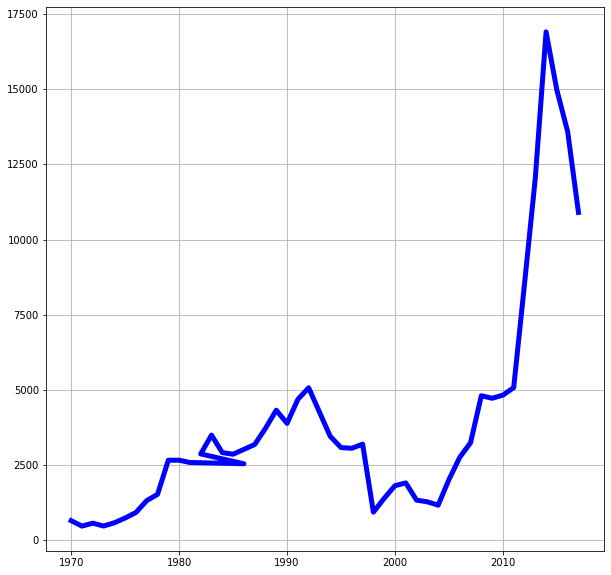

Year with Most number of attacks 2014


In [13]:
#No of attacks each year
Year = terror_data['Year'].unique()
No_of_attacks = data['Year'].value_counts(dropna=False).sort_index()
plt.figure(figsize=(10,10))
plt.plot(Year,No_of_attacks,color='b',linewidth=5.0)
plt.grid(b=True,which='both')
plt.show()
print("Year with Most number of attacks",terror_data['Year'].value_counts().idxmax())

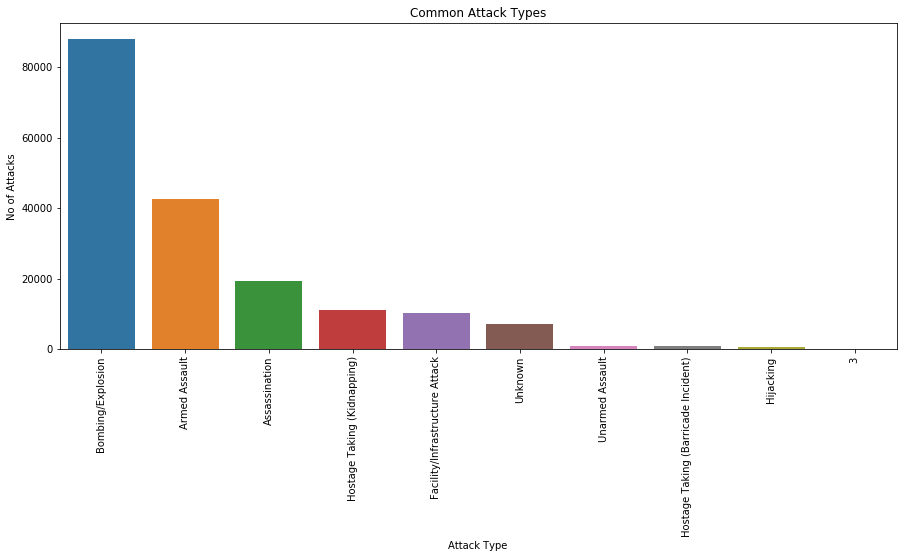

Most Attack Types: Bombing/Explosion


In [14]:
#Now we have to see how many times a certain attack happens
plt.subplots(figsize=(15,6))
Attack_type = terror_data['AttackType'].value_counts()[:10].index
no_of_Attacks = terror_data['AttackType'].value_counts()[:10].values
sns.barplot(Attack_type,no_of_Attacks)
plt.title('Common Attack Types')
plt.xlabel('Attack Type')
plt.ylabel('No of Attacks')
plt.xticks(rotation= 90)
plt.show()
print("Most Attack Types:",terror_data['AttackType'].value_counts().idxmax())


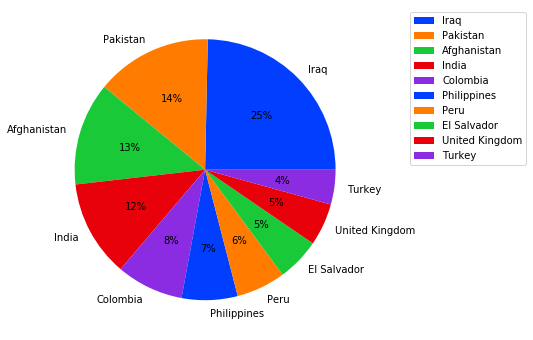

Country with the most attacks: Iraq


In [15]:
#Now We have to see percentage of  top 5 countries which are mostly effected by terrrorism
plt.subplots(figsize=(15,6))
Attack_type = terror_data['Country'].value_counts()[:10].index
no_of_Attacks = terror_data['Country'].value_counts()[:10].values
colors = sns.color_palette('bright')[0:5]
plt.pie(no_of_Attacks, labels = Attack_type, colors = colors, autopct='%.0f%%')
plt.legend(Attack_type,loc='upper right',bbox_to_anchor=(1.5,1))
plt.show()
print("Country with the most attacks:",terror_data['Country'].value_counts().idxmax())

Text(0.5, 1.0, 'Number of Terrorist Attack Year by Year (Ind & Pak)')

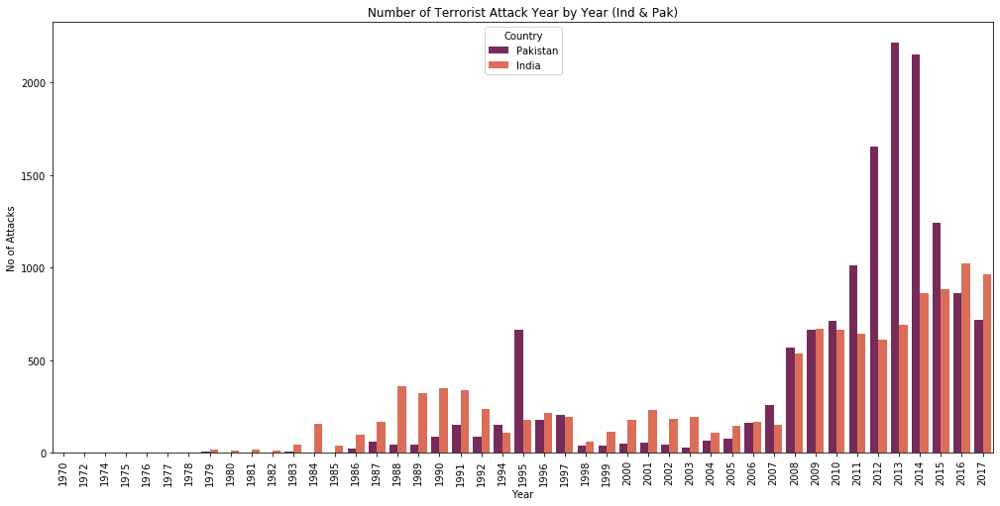

In [16]:
#Comapring number of attacks between India and Pakistan
ind_pak = ['India','Pakistan']
data_IP = terror_data[terror_data['Country'].isin(ind_pak)]
plt.figure(figsize = (17,8))
year_count = sns.countplot(x='Year', data=data_IP, hue='Country', palette="rocket")
year_count.set_xticklabels(year_count.get_xticklabels(), rotation=90)
year_count.set_ylabel('No of Attacks')
plt.title('Number of Terrorist Attack Year by Year (Ind & Pak)', fontsize=12)

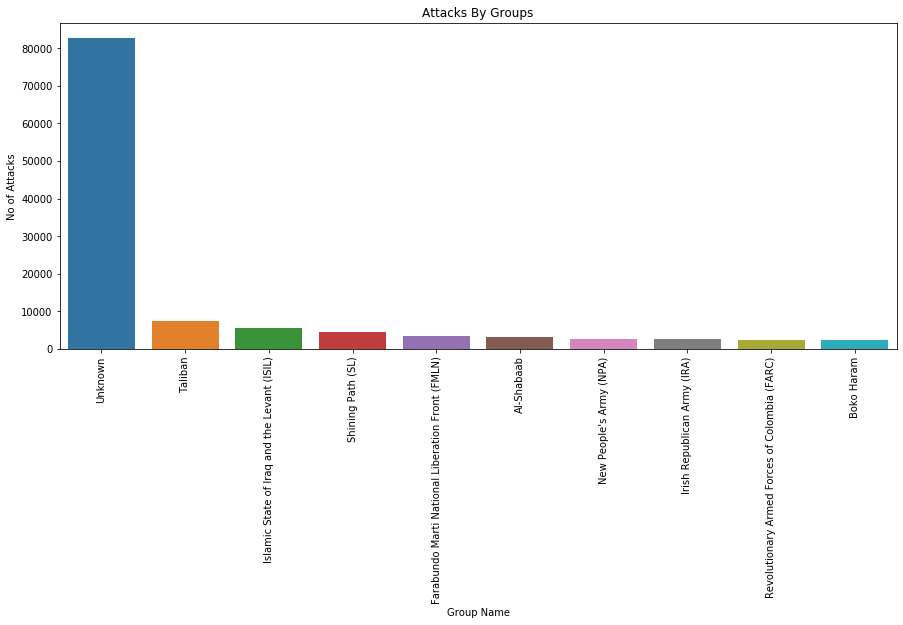

Most Attacks By Groups: Unknown


In [17]:
#Number of attacks by particular group 
plt.subplots(figsize=(15,6))
GroupName = terror_data['GroupName'].value_counts()[:10].index
no_of_Attacks = terror_data['GroupName'].value_counts()[:10].values
sns.barplot(GroupName,no_of_Attacks)
plt.title('Attacks By Groups')
plt.xlabel('Group Name')
plt.ylabel('No of Attacks')
plt.xticks(rotation= 90)
plt.show()
print("Most Attacks By Groups:",terror_data['GroupName'].value_counts().idxmax())


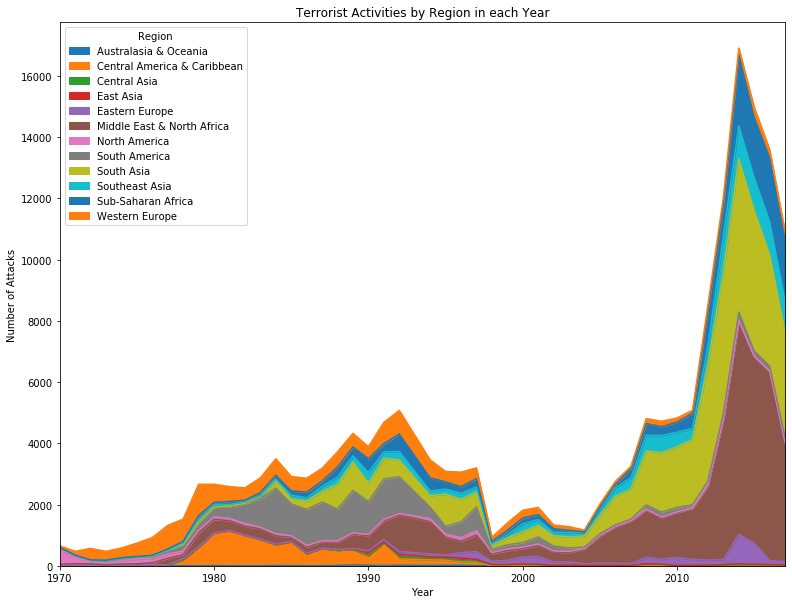

In [18]:
#predicting attacks on region 
p = pd.crosstab(terror_data.Year, terror_data.Region)
p.plot(kind='area',figsize=(13,10))
plt.title('Terrorist Activities by Region in each Year')
plt.ylabel('Number of Attacks')
plt.show()



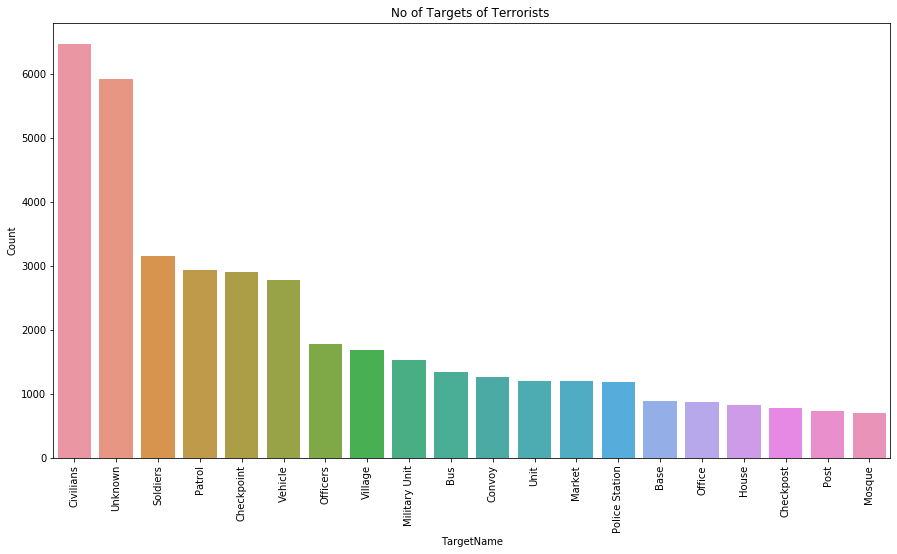

In [19]:
#Now we have to show count of targets of terrorists
TargetName = terror_data['Target'].value_counts()[:20].index
No_of_Targets = terror_data['Target'].value_counts()[:20].values
plt.figure(figsize=(15,8))
sns.barplot(TargetName,No_of_Targets)
plt.title('No of Targets of Terrorists ')
plt.xlabel('TargetName')
plt.ylabel('Count')
plt.xticks(rotation= 90)
plt.show()



In [20]:
#Now plotting Terrorist activities in pakistani cities on Map
country = terror_data['Country'] == 'Pakistan'
p = terror_data[country] 
pak = p.loc[:,'City':'Longitude'].dropna()
paklist = pak.values.tolist()
M = folium.Map(location = [30.3753 , 69.3451], zoom_start=6)
markerCluster = folium.plugins.MarkerCluster().add_to(M)
for p in range(0, len(paklist)):
    folium.Marker(location=[paklist[p][1],paklist[p][2]],popup = paklist[p][0]).add_to(markerCluster)
M